In [1]:
#ToDo 
#Quality control on events. Maybe only include in catalog if DeltaX on event 

# Zachary Katz
# zachary_katz@mines.edu
# 22 December 2023

# PickEvents
#Kernel keeps crashing for such a large df. One way around this is to cut the 
#pickle files off every few years so the data frame isnt so long.

#Thus change to years you want to analyze.


#Imports
import 
import os
import pickle
import datetime
import warnings

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import pandas as pd
import numpy as np
import scipy
import xarray as xr
from PyAstronomy import pyasl

In [2]:
#Class description required to load pickle files
class GPS_data:
    def __init__(self,starts,ends,gaps,data):
        self.increment = increment
        self.starts = starts
        self.ends = ends
        self.gaps = gaps
        self.data = data
        self.name = name

#Class for storing data, times, linear least squares
class Residual_Traces:
    def __init__(self,name,times,x,y,z,residual):
        self.increment = increment
        self.name = name
        self.times = times
        self.xs = x
        self.ys = y
        self.zs = z
        self.residuals = residual

In [3]:
#Load Data from Pickle Files

yearstr = '2014_2015'
dir = './Pickle2014_2015'
resdir = './PickleRes2014_2015'
dir_save = './2014_2015Events'
data = []

In [4]:
for file in os.listdir(dir):
    if file.endswith('.pkl'):
        with open(dir + "/" + file, 'rb') as pickle_file: #Load Pickle File
            ind_data = pickle.load(pickle_file)
            data.append(ind_data)

KeyboardInterrupt: 

In [ ]:
"""
#Testing for using df.merge
df1 = pd.DataFrame({'time': [2, 3,4,5],
                    't': [2, 3, 4, 5]})
df2 = pd.DataFrame({'time': [2, 3,4,5],
                    's': [2, 3, 4, 5]})
df3 = pd.DataFrame({'time': [1, 2,3,4],
                    'd': [1, 2, 3, 4]})
merged=df1.merge(df2,how='outer',on='time')
merged=merged.merge(df3,how='outer',on='time').sort_values(by='time',ignore_index=True)
merged['a'] = merged[list(merged.columns)].sum(axis=1)
print(merged)

for z, sta in enumerate(data[:]):
    print(z, sta.name)

"""

In [6]:
#Event Detection via Linear Least Squares (O(10^2) min)

# Perform using actual times rather than number of data points to accommodate la02's 30 second increments
residual_traces = []

#Look for a more scientific way to choose variables increment and slide
#besides what gives the best event detections.
if yearstr == '2007_2009':
    increment = 300
    slide = 10
else:
    increment = 600
    slide = 25

if increment % slide != 0:
    raise Exception("Increment / Slide not an Integer")

#Loop for each station z
for z, sta in enumerate(data[:]):
    name = sta.name
    print(name)
    times = []
    xs = []
    ys = []
    zs = []
    residuals = []

    #Loop over each start and end time
    for st, en in zip(sta.starts,sta.ends):
        #Get index of data at start and end times
        start = sta.data.loc[sta.data['time'] == st].index[0]
        end = sta.data.loc[sta.data['time'] == en].index[0]
        length = end - start
        if length != 0:
            #Mark current start and end for averaging
            start_pos = 0
            end_pos = start_pos + increment
            first_entry = sta.data.iloc[start].name

            time_arr = sta.data['time'][start:end].reset_index(drop=True)
            x_arr = sta.data['x'][start:end].reset_index(drop=True)
            y_arr = sta.data['y'][start:end].reset_index(drop=True)
            z_arr = sta.data['elevation'][start:end].reset_index(drop=True)
            xs.append(x_arr)
            ys.append(y_arr)
            zs.append(z_arr)
            times.append(time_arr)

            time_in_sec = np.zeros(length)
            for i in range(length):
                time_in_sec[i] = (sta.data['time'][first_entry + i] - datetime.datetime(2000, 1, 1)).total_seconds() #Get time from 2000

 
            #Find the linear least square average at each window
            averaging_pts = np.zeros(length // slide)
            for i in range((length // slide) - increment // slide):
                box = np.zeros(length)
                box[start_pos:end_pos] = 1
                func = np.multiply(sta.data['x'][start:end],box) #Summation
                func = func[start_pos:end_pos]
                M = np.ones((len(func),2))
                M[:,1] = time_in_sec[start_pos:end_pos]
                p, res, rnk, s = scipy.linalg.lstsq(M, func)
                averaging_pts[i] = res
                start_pos += slide
                end_pos += slide

            #Create residual array by using average at each point
            residual_arr = np.zeros(length)
            start_pos = 0
            end_pos = start_pos + increment
            first_entry = sta.data.iloc[start].name

            num = increment // slide
            for i in range(length // slide):
                if i > increment // slide:
                    avg = 0
                    for j in range(i-num,i):
                        avg = avg + averaging_pts[j]
                    residual_arr[start_pos:end_pos] = avg / num
                start_pos += slide
                end_pos += slide
            residuals.append(residual_arr)

    #Make new object and append to array of objects
    obj = Residual_Traces(name, times, xs, ys, zs, residuals)
    residual_traces.append(obj)

gz19
gz20
la02
la07
la08
la09
la14
la16
la17
la18
mg04


In [ ]:
for trace in residual_traces:
    with open(yearstr + trace.name + 'res.pkl', 'wb') as file: #Save to Pickle File
        pickle.dump(trace, file)

NameError: name 'residual_traces' is not defined

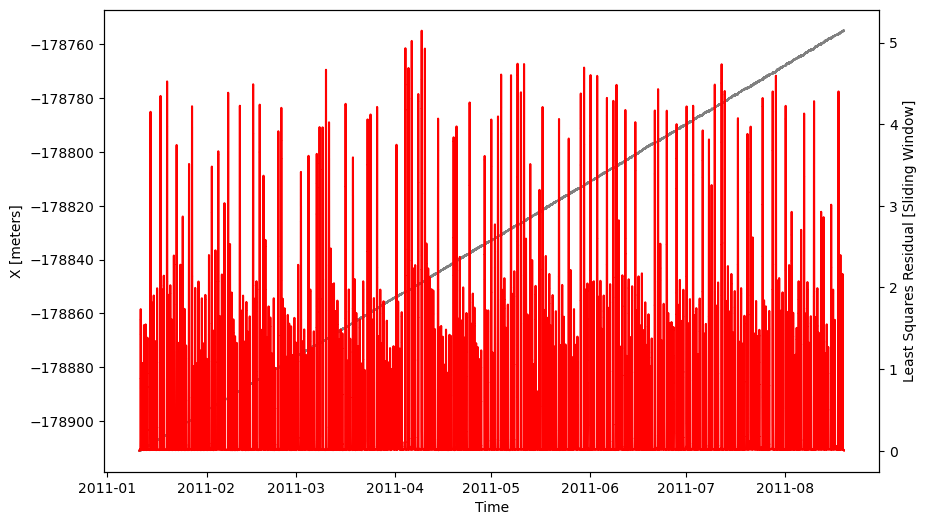

In [11]:
#Example plot of individual trace [Don't need to run this cell]
for n in range(1):
    fig, ax1 = plt.subplots(figsize=(10,6))
    ax1.plot(residual_traces[n].times[n],residual_traces[n].xs[n],color="gray")
    ax1.set_ylabel('X [meters]')
    ax1.set_xlabel('Time')
    ax2 = ax1.twinx() 
    ax2.plot(residual_traces[n].times[n],residual_traces[n].residuals[n],color='red')
    ax2.set_ylabel('Least Squares Residual [Sliding Window]')
    #ax2.set_ylim(0,0.05)


In [4]:
#Reload pickle files we just saved
residual_traces = []

for file in os.listdir(resdir):
    if file.endswith('.pkl'):
        with open(resdir + "/" + file, 'rb') as pickle_file: #Load Pickle File
            trace = pickle.load(pickle_file)
            residual_traces.append(trace)


In [5]:
#Make mega dataframe with all traces and Nan if station not operating O(10 min)
#Requires almost all computer memory - close other stuff!
#Make individual dataframes to merge and merge dataframes
for iter, sta in enumerate(residual_traces):
    #print(iter,sta.name)
    flat_times = []
    for xs in sta.times:
        for x in xs:
            flat_times.append(x)
    flat_xs = []
    for xs in sta.xs:
        for x in xs:
            flat_xs.append(x)
    flat_res = []
    for xs in sta.residuals:
        for x in xs:
            flat_res.append(x)
    flat_ys = []
    for xs in sta.ys:
        for x in xs:
            flat_ys.append(x)
    df = pd.DataFrame({'time': flat_times,
                        sta.name +'x': flat_xs,
                        sta.name +'y': flat_ys,
                        sta.name + 'res': flat_res})
    if iter == 0:
        merged = df
    if iter >= 1:
        merged=merged.merge(df,how='outer',on='time')

merged = merged.sort_values(by='time',ignore_index=True)
#print(merged) 

In [6]:
#Get sorted list of onsets and offsets
start_end = pd.DataFrame(columns=["times","onset","station"])

for sta in residual_traces:
    for time_arr in sta.times:
        start_end.loc[len(start_end)] = [time_arr[0],True,sta.name]
        start_end.loc[len(start_end)] = [time_arr[len(time_arr)-1],False,sta.name]


sorted = start_end.sort_values(by=['times','onset'],ascending=[True,False]).reset_index(drop=True)
#print(sorted)

In [8]:
#Get list of indices where stations turn on or off
indices = []
for time in sorted['times']:
    index = merged.index[merged['time'] == time][0]
    indices.append(index)

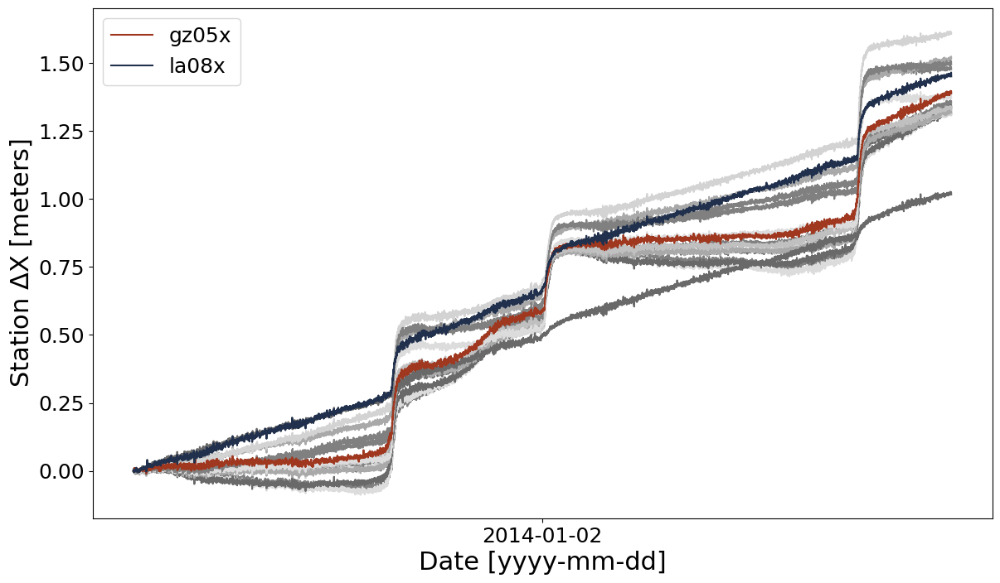

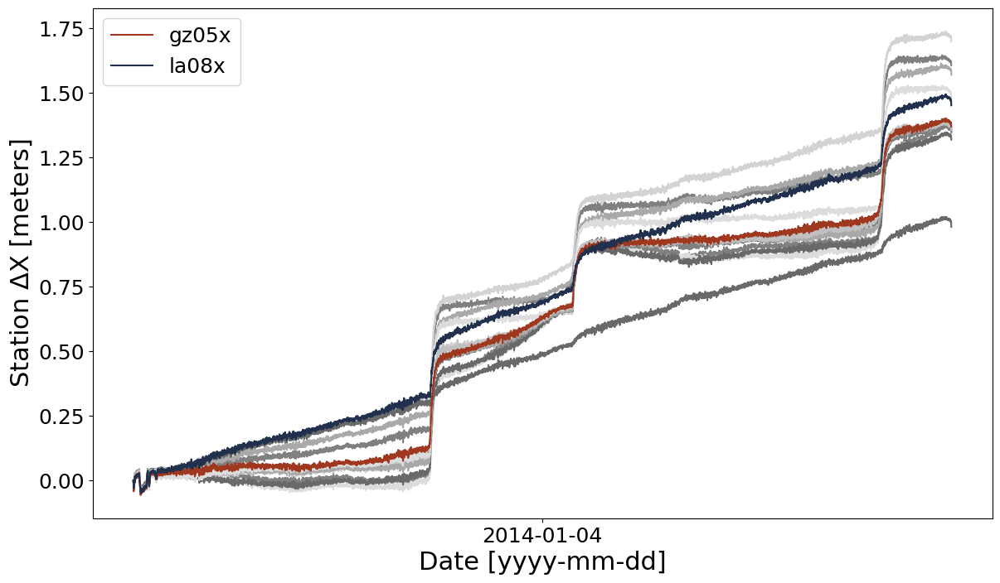

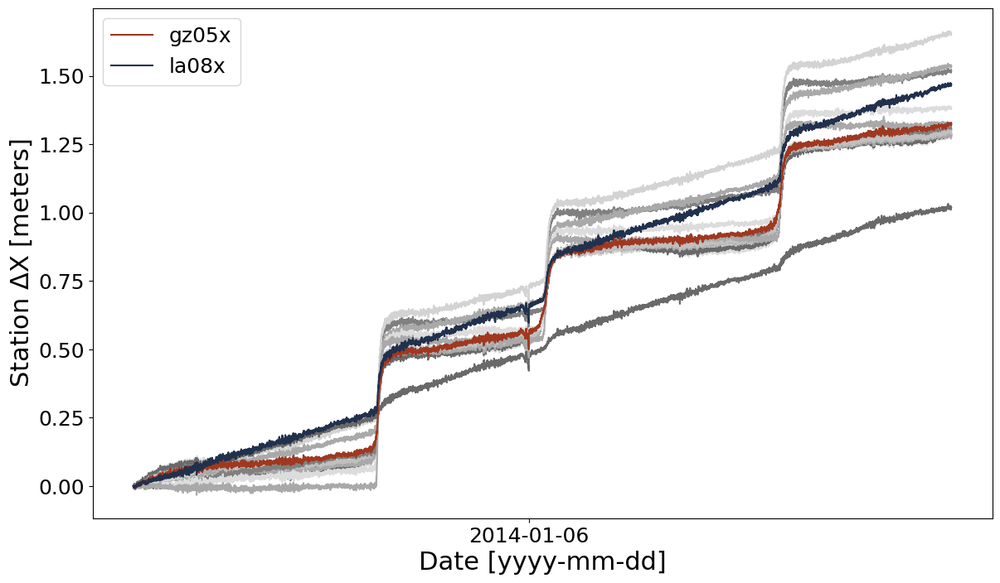

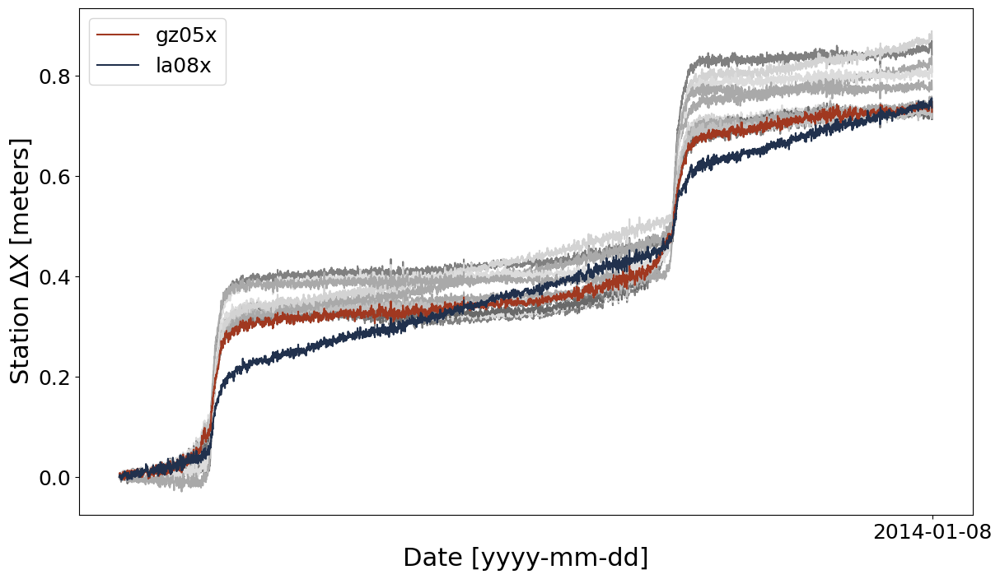

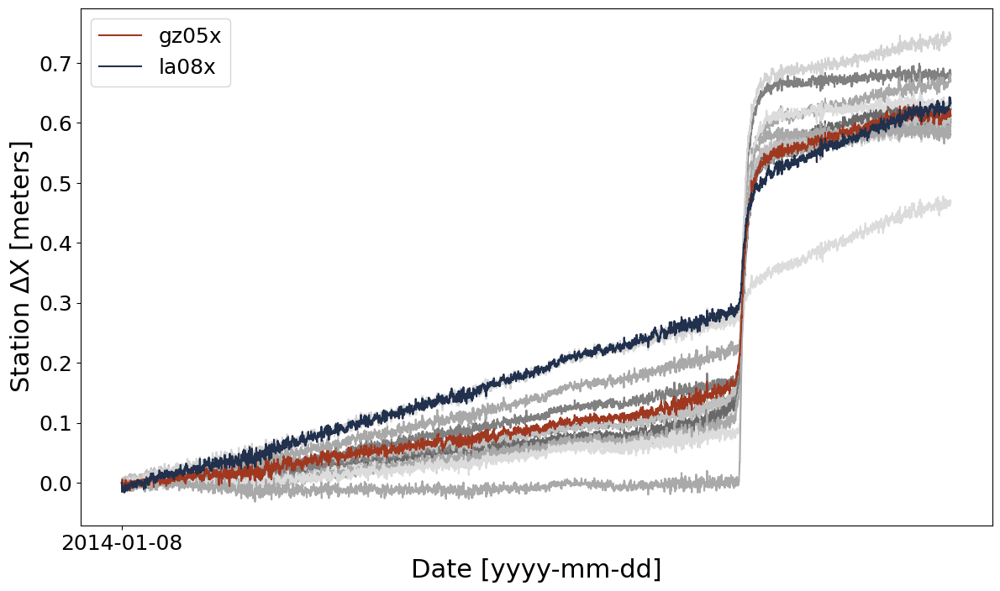

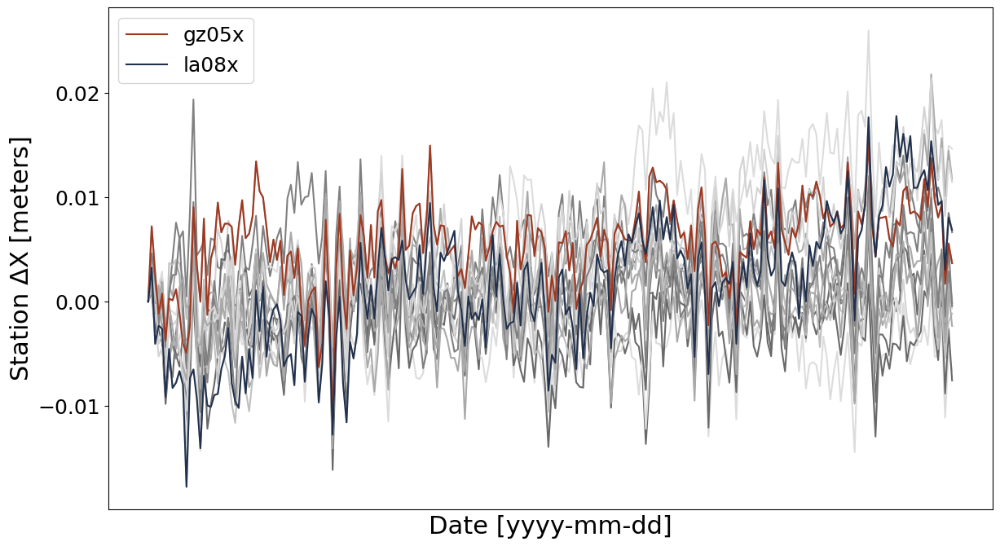

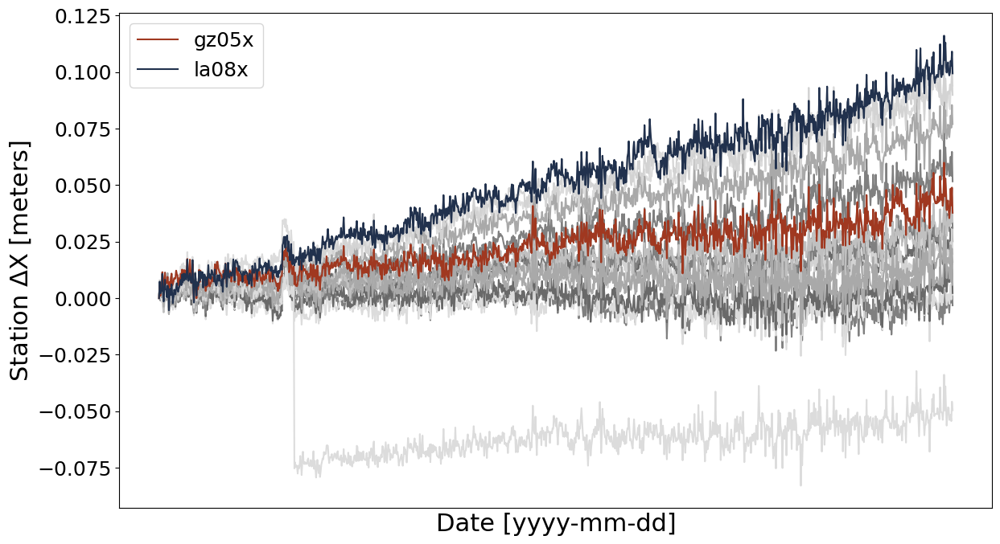

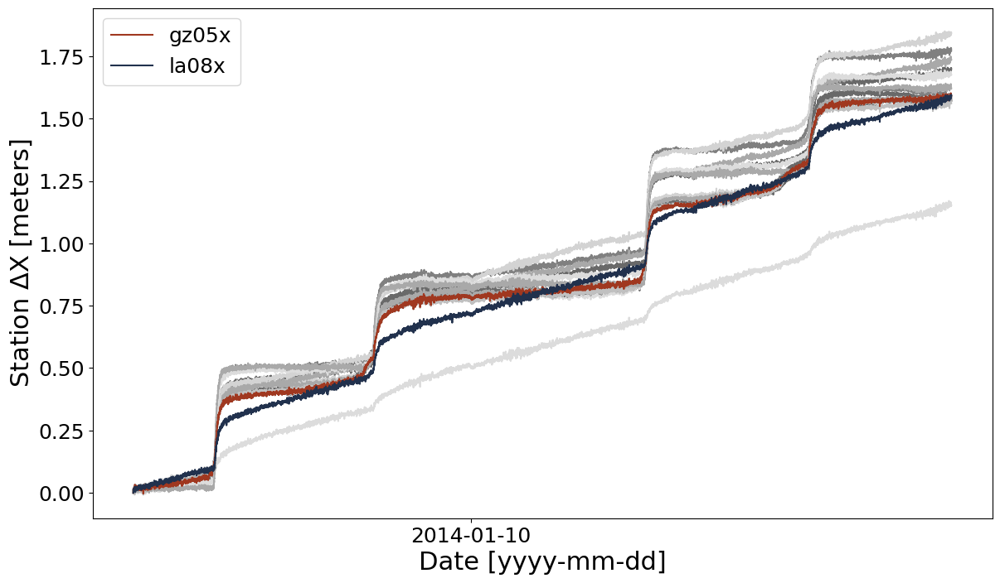

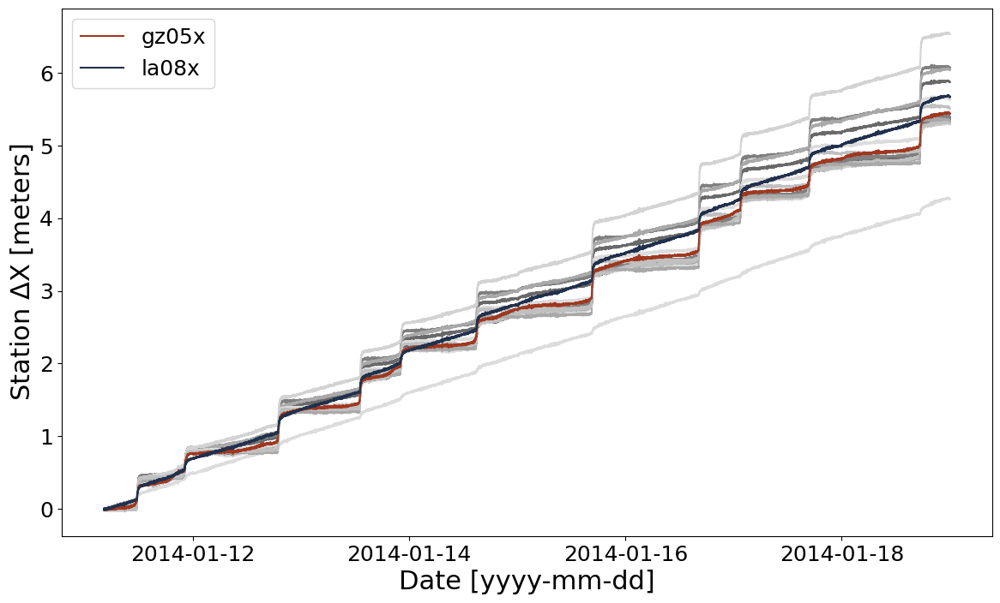

In [36]:
# Plot active traces
import matplotlib.ticker as ticker 
x_cols = [col for col in merged if col.endswith('x')]
for i, index in enumerate(indices[:25]):
    if i > 0:
        if indices[i-1] != indices[i]:
            start = indices[i-1]
            end = index
            
            fig, ax1 = plt.subplots(figsize=(14,8))
            colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#7f7f7f', '#17becf','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
            colors = ['dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro']
            special_colors = [(160/255,56/255,32/255) ,(33/255,49/255,77/255)]
            special = 0
            for j, x_col in enumerate(x_cols): 
                #print(i)
                ax1.plot(merged['time'][start:end],merged[x_col][start:end]-np.mean(merged[x_col][start:end])-np.ones_like(merged[x_col][start:end])*(merged[x_col][start]-np.mean(merged[x_col][start:end])), color = colors[j])

            for j, x_col in enumerate(x_cols): 
                if x_col == 'gz05x' or x_col == 'la08x':
                    ax1.plot(merged['time'][start:end],merged[x_col][start:end]-np.mean(merged[x_col][start:end])-np.ones_like(merged[x_col][start:end])*(merged[x_col][start]-np.mean(merged[x_col][start:end])), color = special_colors[special],label=x_col)
                    special+=1
            
            ax1.set_ylabel('Station $\Delta$X [meters]',size=22)
            ax1.set_xlabel('Date [yyyy-mm-dd]',size=22)
           
            ax1.tick_params(axis='y', labelsize=18)
            ax1.tick_params(axis='x', labelsize=18)
            ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
            ax1.xaxis.set_major_locator(ticker.MultipleLocator(2)) 
            ax1.legend(fontsize=18)
  
            

In [7]:
# For 2007-2009 I used thresh = avg + 0.5 * std
    # and checked to ensure both traces were active.
# For 2010-2019 I used thresh = avg

#Find combined least square residual for each time block O(10 min)
res_cols = [col for col in merged if col.endswith('res')]
x_cols = [col for col in merged if col.endswith('x')]

merged['ressum'] = merged[res_cols].sum(axis=1)
#Use the peaks and an average thresholding algortihm to pick out the events.
avg = np.average(merged['ressum'])
std = np.std(merged['ressum'])
print(avg,std)

event = np.zeros(len(merged['ressum']))
thresh = avg #Threshold choice here e.g, avg + std

for i in range(len(event)):
    nansum = 0
    for col in x_cols:
        nan_check = merged[col][i]
        if np.isnan(nan_check):
            nansum += 1
    if merged['ressum'][i] > thresh and nansum < len(x_cols) - 1: #Check at least two non-nan cols
        event[i] = 1
merged['event'] = event

#Get list of indices where stations turn on or off
indices = []
for time in sorted['times']:
    index = merged.index[merged['time'] == time][0]
    indices.append(index)


3.5916078895167627 10.130437126373808


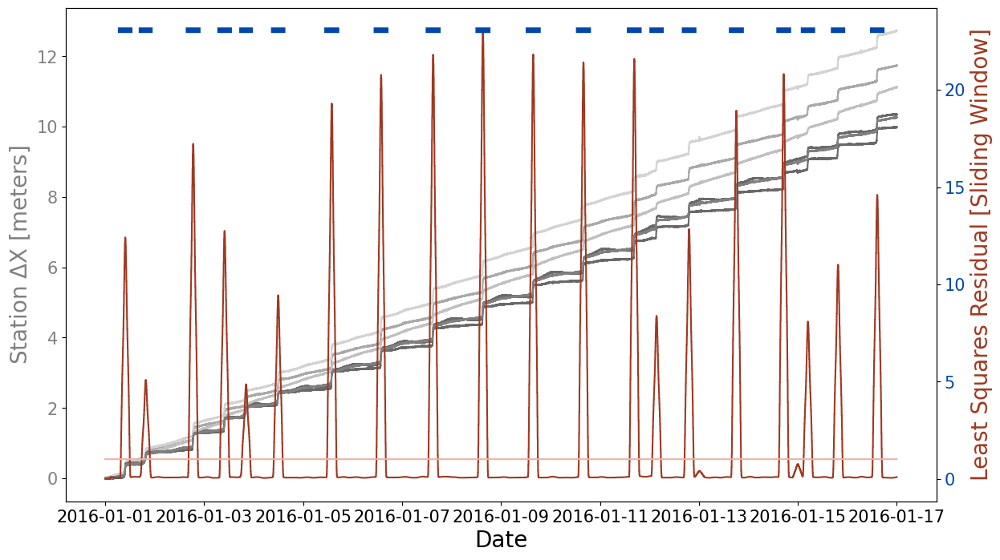

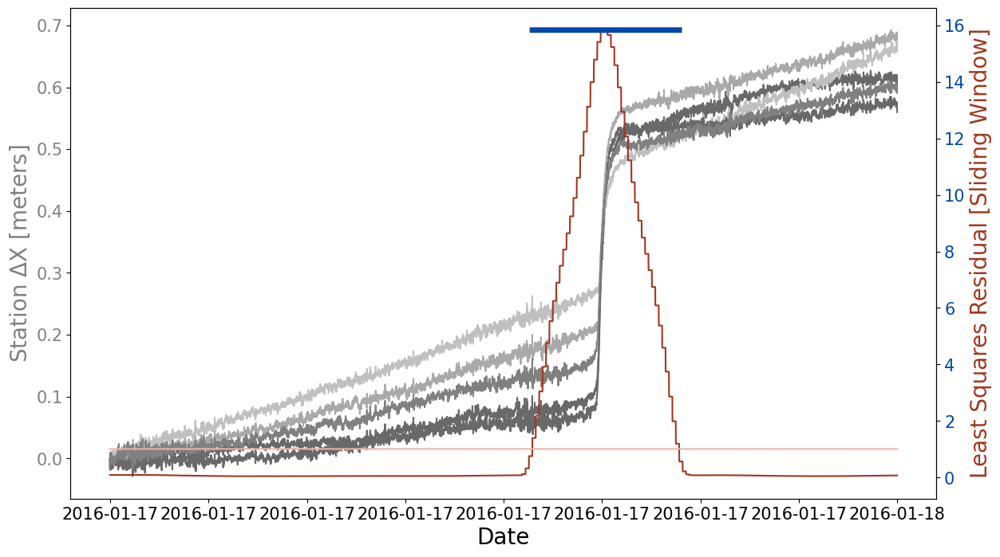

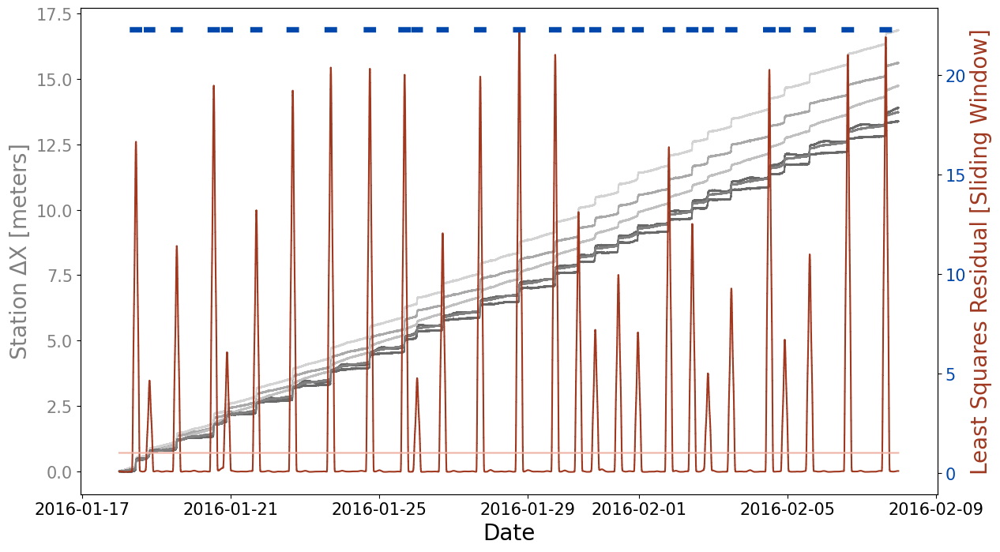

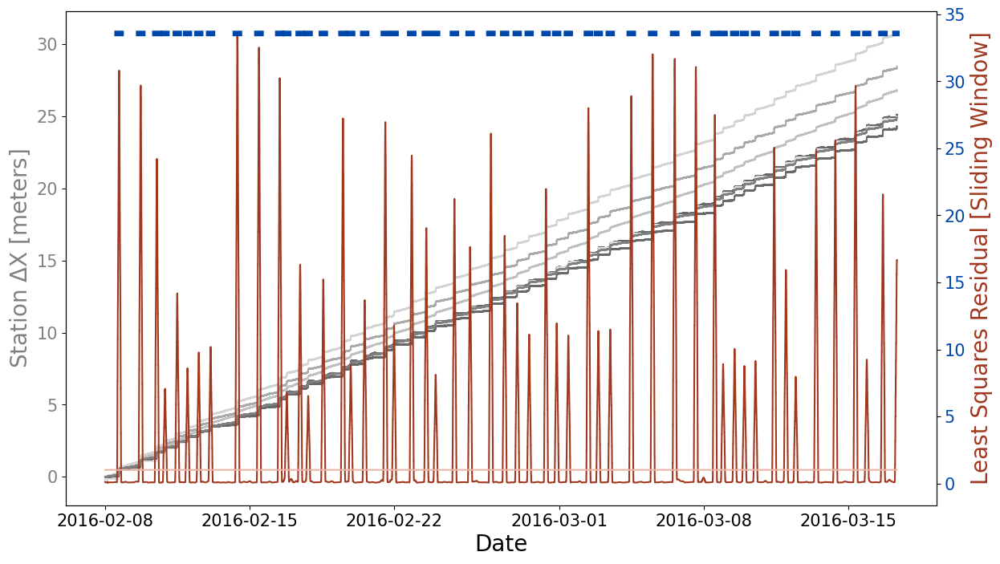

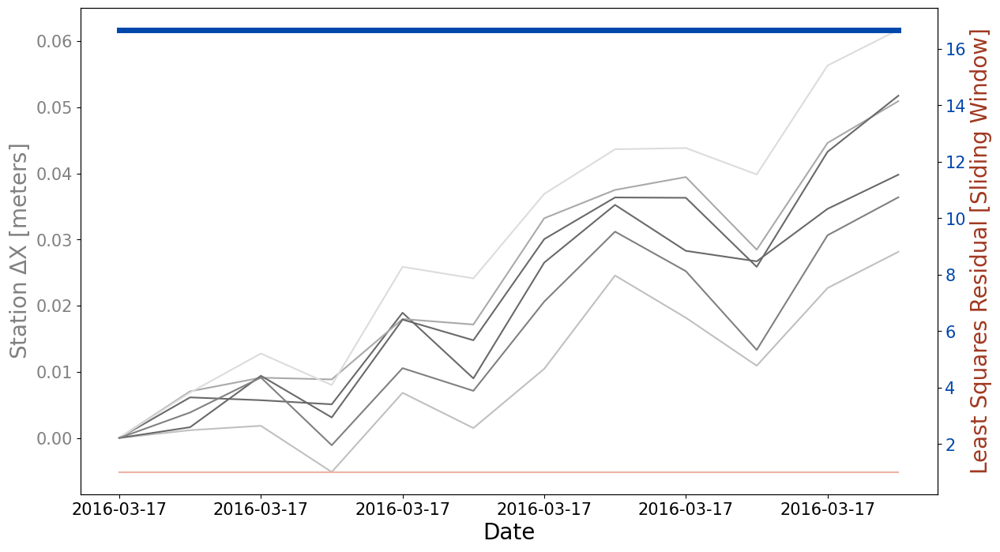

...

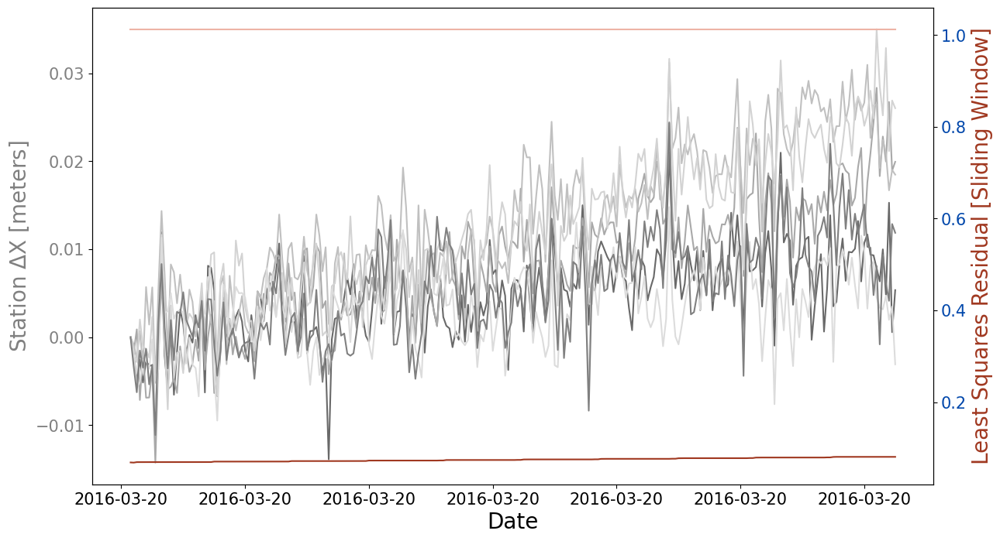

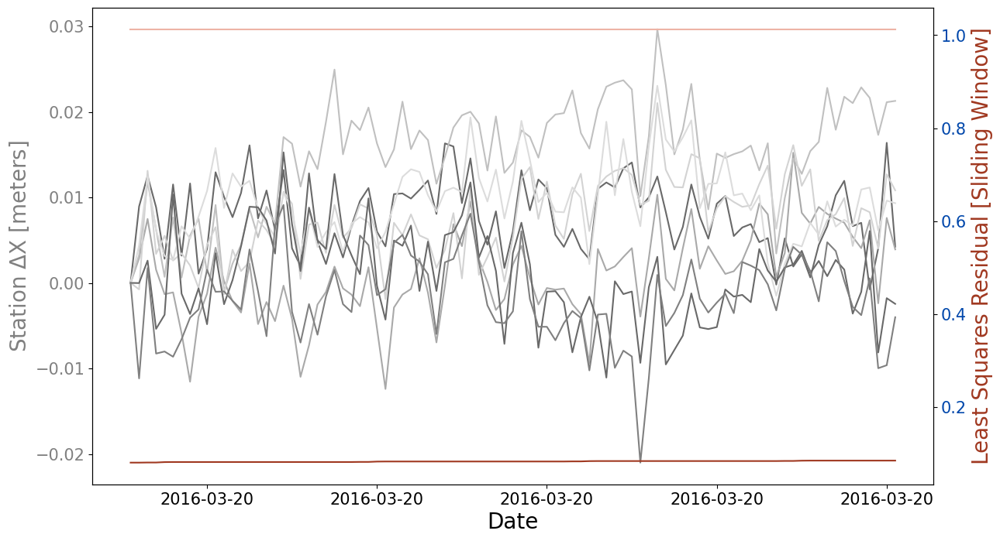

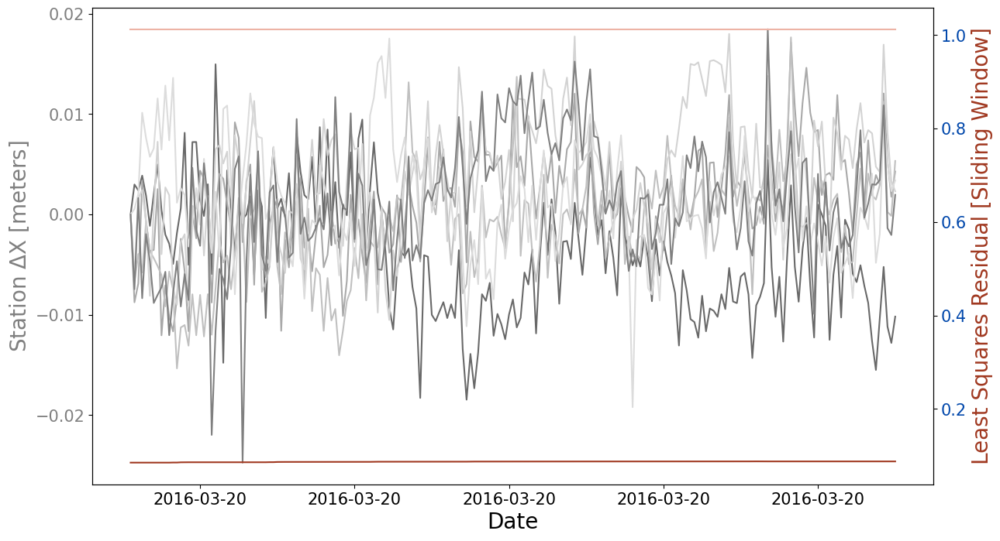

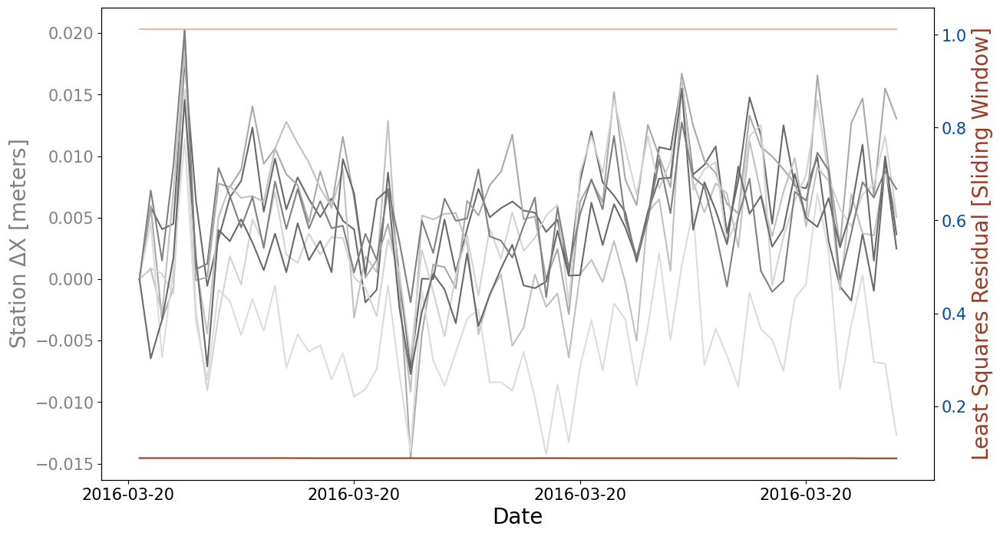

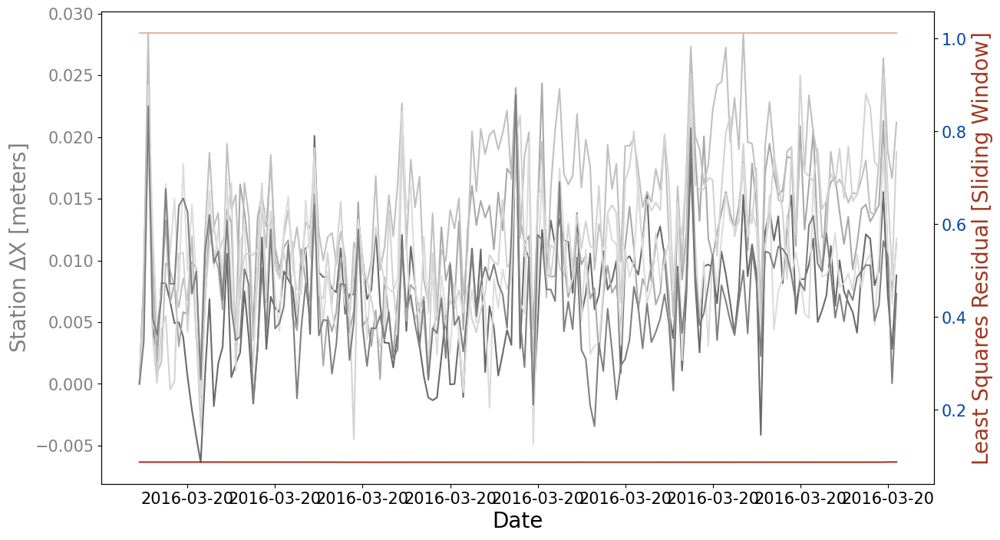

In [36]:
#Plot residual sum, threshold, and all active traces [Don't need to run cell]
for i, index in enumerate(indices[:25]):
    if i > 0:
        if indices[i-1] != indices[i]:
            start = indices[i-1]
            end = index
            
            fig, ax1 = plt.subplots(figsize=(14,8))
            colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#7f7f7f', '#17becf','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
            colors = ['dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro','dimgray','gray','darkgray','silver','lightgray','gainsboro']
            for j, x_col in enumerate(x_cols): 
                #print(i)
                ax1.plot(merged['time'][start:end],merged[x_col][start:end]-np.mean(merged[x_col][start:end])-np.ones_like(merged[x_col][start:end])*(merged[x_col][start]-np.mean(merged[x_col][start:end])), color = colors[j])
            ax1.set_ylabel('Station $\Delta$X [meters]',size=20,color='gray')
            ax1.set_xlabel('Date',size=20)
            ax2 = ax1.twinx() 
            rd = (160/255,56/255,32/255)
            ax2.plot(merged['time'][start:end],merged['ressum'][start:end],color=rd)
            ltred = (237/255,179/255,165/255)
            ax2.plot(merged['time'][start:end],np.ones_like(merged['ressum'][start:end])*thresh,color=ltred)
            ax2.set_ylabel('Least Squares Residual [Sliding Window]',size=20,color=rd)
            ax3 = ax1.twinx()
            ax3.set_axis_off()
            masked = np.ma.masked_array(merged['event'][start:end],mask=(1 - merged['event'][start:end]))
            bl = (33/255,49/255,77/255)
            ax3.plot(merged['time'][start:end], masked,color="#0047AB" ,linewidth=5)
            ax3.plot(merged['time'][start:end],np.zeros_like(merged['time'][start:end]),alpha=0)
            ax1.tick_params(axis='y', labelsize=15,labelcolor='gray')
            ax2.tick_params(axis='y', labelsize=15,labelcolor="#0047AB")
            ax1.tick_params(axis='x', labelsize=15)
            ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
            

In [54]:
# Make input text file for pretty GMT plot of the least squares residual and threshold
# DO NOT NEED TO RUN CELL
#Plot residual sum, threshold, and all active traces [Don't need to run cell]
for i, index in enumerate(indices[:25]):
    if i > 0:
        if indices[i-1] != indices[i]:
            start = indices[i-1]
            end = index
            if i == 21:
                df = pd.DataFrame()
                time = merged['time'][start:end]
                df.insert(len(df.columns),"Time",time)
                for j, x_col in enumerate(x_cols): 
                    x_j = merged[x_col][start:end]-np.mean(merged[x_col][start:end])-np.ones_like(merged[x_col][start:end])*(merged[x_col][start]-np.mean(merged[x_col][start:end]))
                    if not np.isnan(x_j.iloc[0]):
                        df.insert(len(df.columns),x_col,x_j)
                ressum = merged['ressum'][start:end]
                thres = np.ones_like(merged['ressum'][start:end])*thresh
                event = merged['event'][start:end]
                df.insert(len(df.columns),"Ressum",ressum)
                df.insert(len(df.columns),"Threshold",thres)
                df.insert(len(df.columns),"Event",event)
                print(df)
                df.to_csv("LeastSquaresGMT.txt", sep="\t", index=False)

                      Time     gz01x     gz14x     gz15x     la01x     la04x  \
133725 2013-01-24 05:11:15  0.000000  0.000000  0.000000  0.000000  0.000000   
133726 2013-01-24 05:11:30  0.002558  0.001666  0.002080  0.001187  0.000579   
133727 2013-01-24 05:11:45  0.002135 -0.000992  0.003134  0.001201  0.001394   
133728 2013-01-24 05:12:00  0.002059 -0.002913  0.004345  0.000416  0.002294   
133729 2013-01-24 05:12:15  0.007420  0.002064  0.011182  0.007327  0.009460   
...                    ...       ...       ...       ...       ...       ...   
161311 2013-01-29 00:07:45  3.474645  3.527580  3.530037  4.415894  3.871221   
161312 2013-01-29 00:08:00  3.471125  3.526630  3.532112  4.416304  3.866557   
161313 2013-01-29 00:08:15  3.470889  3.529472  3.533239  4.411059  3.866553   
161314 2013-01-29 00:08:30  3.471383  3.528683  3.535955  4.415049  3.866673   
161315 2013-01-29 00:08:45  3.476582  3.534729  3.540760  4.420003  3.871277   

           la06x     la07x     la08x   

In [8]:
#Make the Event Catalog
start_indices = []
end_indices = []
for i, event in enumerate(merged['event']):
    if i >= 1:
        prior_i = merged['event'][i-1]
        if prior_i < event:
            start_indices.append(i)
        elif prior_i > event:
            end_indices.append(i)
print(start_indices)
print(end_indices)

[3175, 5375, 9725, 15225, 17300, 21575, 26100, 28575, 32000, 35100, 38165, 43800, 47750, 50040, 53825, 56175, 59900, 62482, 67400, 71765, 73975, 77975, 84100, 89800, 92075, 95700, 101600, 107400, 113134, 118250, 123350, 126549, 130875, 134375, 136857, 140381, 143384, 146709, 152514, 158384, 164425, 170359, 176625, 180888, 183189, 186541, 189325, 192474, 195525, 198532, 202224, 205075, 209483, 214965, 217146, 220800, 223107, 226700, 229124, 232633, 235200, 238906, 245014, 251846, 256732, 259056, 263007, 268463, 274200, 278750, 284349, 289915, 293575, 296382, 301238, 303871, 307234, 310215, 313525, 319224, 321399, 325349, 331319, 336409, 338508, 341725, 344425, 347500, 350484, 353409, 356634, 359600, 365215, 369799, 376024, 381756, 384032, 387496, 389975, 393432, 396009, 399428, 402250, 405546, 411324, 413875, 417450, 423709, 428559, 431507, 437525, 440625, 444809, 450565, 456340, 462215, 468034, 474050, 476839, 479981, 482875, 486371, 491734, 493949, 497158, 499800, 502757, 505657, 5085

In [9]:
catalog = np.empty(len(start_indices),dtype='object_')

x = 0
for s, e in zip(start_indices, end_indices):
    catalog[x] = (merged.iloc[s:e])
    x += 1
print("Catalog Length: " + str(len(catalog)) + " Events")

Catalog Length: 894 Events


In [10]:
def plot_event(event_to_plot):
    """
    Plot a single event from the catalog
    event_to_plot: Catalog Number of Event To Plot
    """

    #res_cols = [col for col in merged if col.endswith('res')]
    x_cols = [col for col in event_to_plot if col.endswith('x')]
    fig, ax1 = plt.subplots()
    first = True
    for i, x_col in enumerate(x_cols):
        demeaned_to_0 = (event_to_plot[x_col]-np.mean(event_to_plot[x_col])) - (event_to_plot[x_col][event_to_plot.index[0]] - np.mean(event_to_plot[x_col]))
        if not np.isnan(event_to_plot[x_col][event_to_plot.index[0]]):
            if first:
                ax2_dummy = demeaned_to_0
                first = False
            ax1.plot(event_to_plot['time'], demeaned_to_0,label=x_col[:-1])
    ax1.set_ylabel('X Displacement [meters]')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax1.legend()

    #Setup dates using second axis
    ax2 = ax1.twiny()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d %b %Y'))
    fig.subplots_adjust(bottom=0.10)
    ax2.set_frame_on(True)
    ax2.patch.set_visible(False)
    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 20))
    ax2.set_xlabel('DateTime')
    
    #Need to plot something on ax2 to getthe correct dates
    ax2.plot(event_to_plot['time'],ax2_dummy)
    for label in ax2.xaxis.get_ticklabels()[::2]:
        label.set_visible(False)
    

In [11]:
#Initial attempt at culling by just taking anything less than an hour and 
# assuming it is not an event. Not this definitley gets rid of some real events.

rev_catalog = []
for event in catalog:
    start = event.iloc[0]['time']
    end = event.iloc[-1]['time']
    if end-start > datetime.timedelta(minutes=30):
        rev_catalog.append(event)

In [12]:
print(len(rev_catalog))
print(len(catalog))

889
894


In [13]:
#Save rev_catalog dataframes as txt files
for event in rev_catalog:
    timestamp = event['time'].iloc[0]
    datestring = '_'.join(str(timestamp).split())
    datestring = datestring.replace(":", "-" )
    event.to_csv(dir_save + '/' + datestring + '.txt',sep='\t')


In [16]:
#List event start and end times in decimal year format for comparison with Matt's catalog allslip20150415.dat
print("StartTime","EndTime", sep='\t')
for event in rev_catalog:
    start = event.iloc[0]['time']
    end = event.iloc[-1]['time']
    start_dec = pyasl.decimalYear(start)
    end_dec = pyasl.decimalYear(end)
    print(start_dec,end_dec, sep='\t')

StartTime	EndTime
2010.040153633942	2010.040593131659
2010.0416081621004	2010.0417732115677
2010.0430469939117	2010.0434032534247
2010.0456035958905	2010.0460659246576
2010.0468959284626	2010.0472284056316
2010.0484836377473	2010.0488945966515
2010.0510378614915	2010.051491628615
2010.0536991057838	2010.0541504946727
2010.0557933789955	2010.056233828006
2010.0569796423135	2010.0573715753424
2010.0584579528158	2010.0588736681887
2010.0597398211569	2010.060118436073
2010.0612276445966	2010.0616352739726
2010.0624771689497	2010.062856259513
2010.064031107306	2010.064438736682
2010.0652501902587	2010.0656159627092
2010.0668402777778	2010.0672474315068
2010.0680636415525	2010.068397545662
2010.0696927321158	2010.0701098744291
2010.0708485540335	2010.0711444063927
2010.072629851598	2010.073057458143
2010.0754765981735	2010.0759470129376
2010.0764707001522	2010.0768269596651
2010.0782472412482	2010.0786819824962
2010.0792993721461	2010.0796570585997
2010.0811096841705	2010.0815372907155
2010.

/tmp/ipykernel_78348/2680717296.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax1 = plt.subplots()


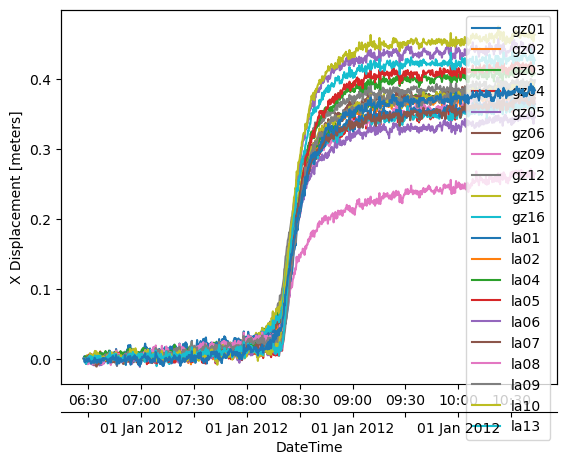

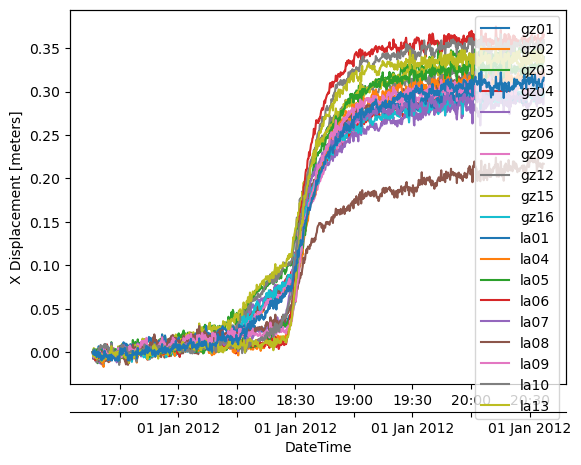

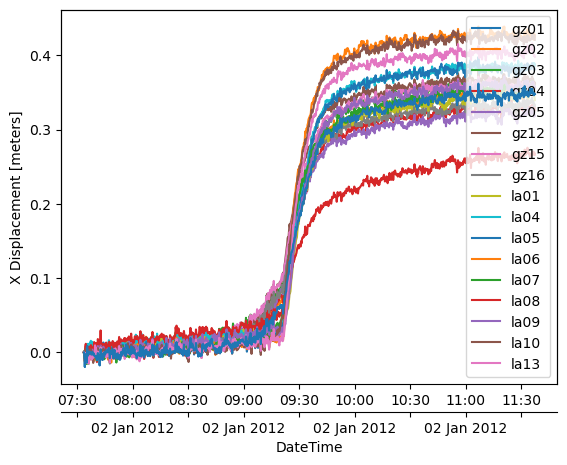

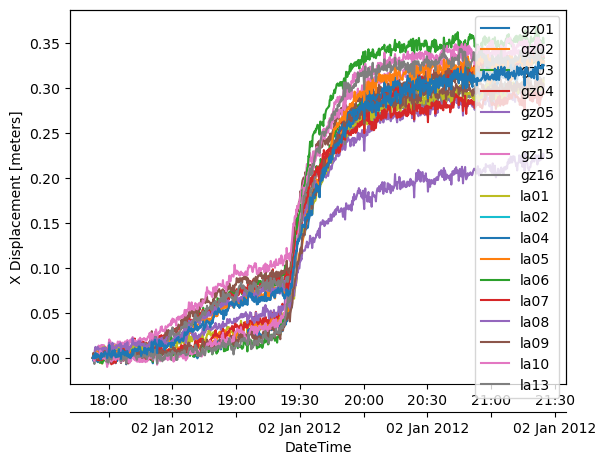

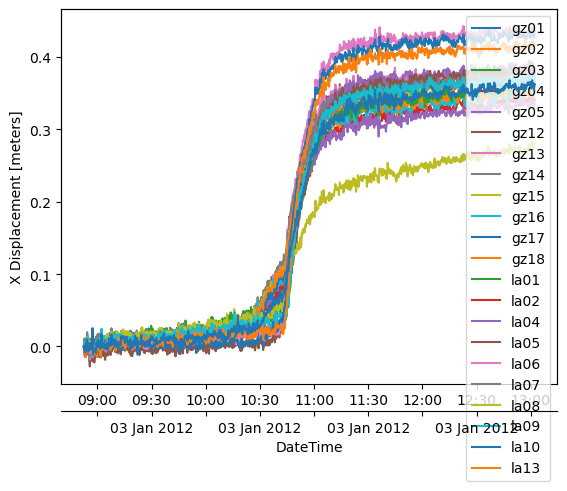

...

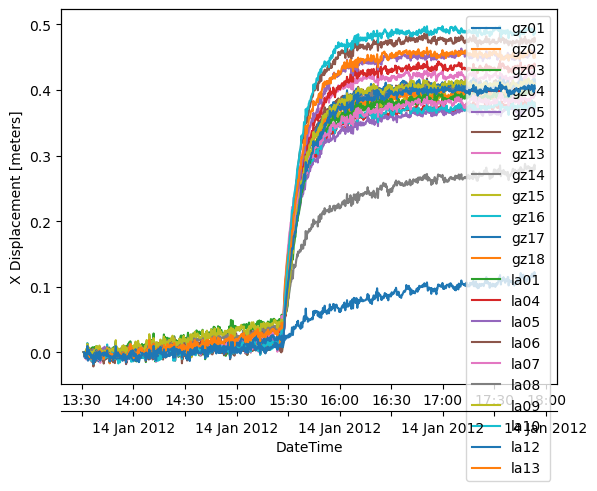

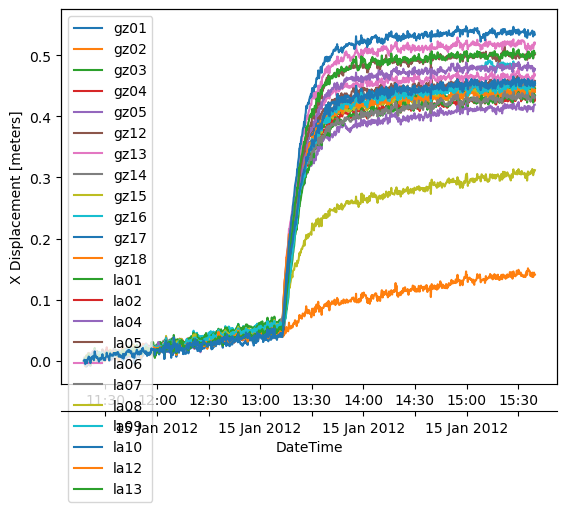

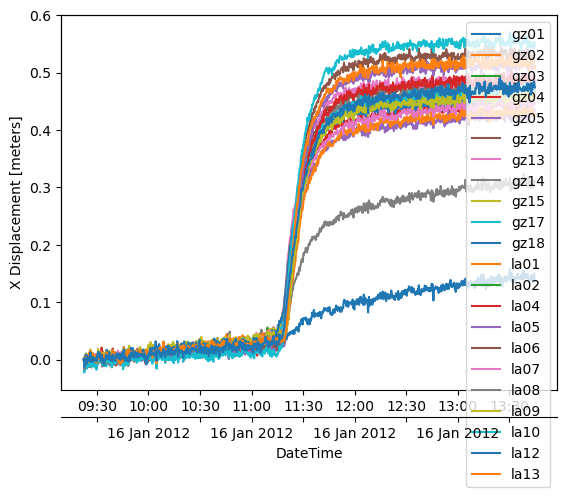

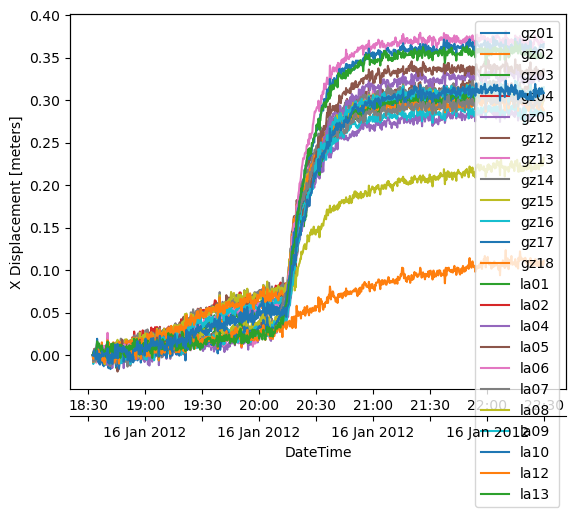

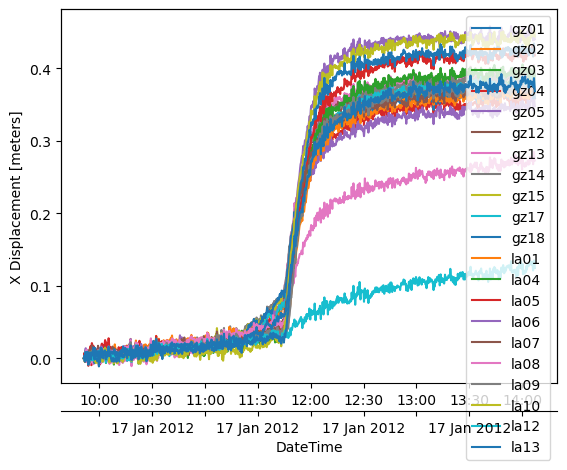

In [15]:
for event in rev_catalog[:25]:
    plot_event(event)